# Experiment 1: 

## Generating datasets from Van der Waals Equation

The Van der Waals equation is an equation of state for gases that provides an improvement over the ideal gas law by incorporating corrections for the finite size of gas molecules and the attractive forces between them. It is given by:

$$
\left( P + \frac{{aN^2}}{{V^2}} \right) (V - Nb) = NRT
$$

Where:
- \( P \) is the pressure of the gas, [atm]
- \( V \) is the volume of the gas, [L]
- \( T \) is the temperature of the gas, [K]
- \( N \) is the number of moles of the gas, [mol]
- \( a \) and \( b \) are Van der Waals constants specific to each gas, a = [L^2 atm/mol^2], b = [L/mol]
- \( R \) is the gas constant, 0.0821 [L·atm/(mol·K)]

The Van der Waals equation provides a more accurate description of the behavior of real gases, especially at high pressures and low temperatures, where the assumptions of the ideal gas law start to break down. 

The term  \( aN^2/V^2 \) corrects for the attractive forces between gas molecules, while the term \( Nb \) corrects for the volume occupied by the gas molecules themselves.
It's important to note that the Van der Waals constants \( a \) and \( b \) vary depending on the specific gas and are experimentally determined. Hence, we have used available tabular values for the various gases included in the datasets below. 

In [1]:
# Import all neccesary functions, libraries and packages: 
from helper_functions import *

# Set random state for reproducibility
set_random_seed(42)

In [2]:
# Define the parameters for generating datasets
V_mean, V_std = 50, 5 # [L]
n_mean, n_std = 15, 1 # [mol]
T_mean, T_std = 300, 25 # [K]

# Constants for gases (a and b parameters) and their ranges
# a = [L^2 atm/mol^2], b = [L/mol]
gas_data = {
    "Ideal Gas": {"a": 0, "b": 0},
    "Nitrogen": {"a": 1.390, "b": 0.0391},
    "Oxygen": {"a": 1.360, "b": 0.0318},
    "Argon": {"a": 1.355, "b": 0.032},
    "Carbon Dioxide": {"a": 3.610, "b": 0.0427},
    "Methane": {"a": 2.250, "b": 0.0428},
    "Hydrogen": {"a": 0.244, "b": 0.0266},
    "Helium": {"a": 0.0346, "b": 0.0237},
    "Neon": {"a": 0.211, "b": 0.0174},
    "Xenon": {"a": 4.00, "b": 0.051}
}

# Generate datasets for sorted gases
num_samples = 10000  # Number of samples per gas
datasets = {}
for gas, data in gas_data.items():
    a, b = data["a"], data["b"]
    dataset = generate_dataset(num_samples, V_mean, V_std, n_mean, n_std, T_mean, T_std, a, b)
    datasets[gas] = dataset
    # Save dataset as CSV
    dataset.to_csv(f"dataset_{gas}.csv", index=False, header=["Volume (L)", "Moles", "Temperature (K)", "Pressure (Pa)"])

## Viualize dataset:

We first do a quick visualization of the various parameter distributions across the different datasets 
(choose between plot_hist() for the histogram, or "plot_dist()" for a kde estimate of the distributions). 

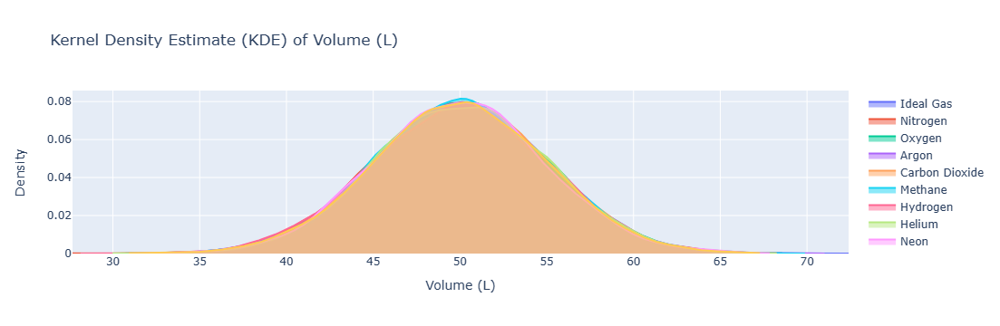

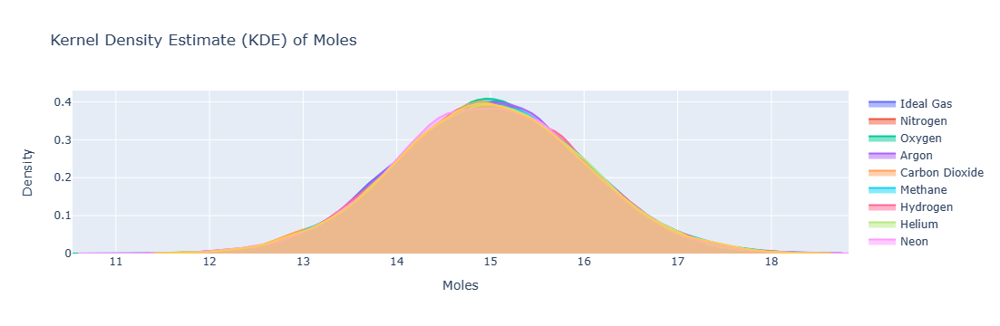

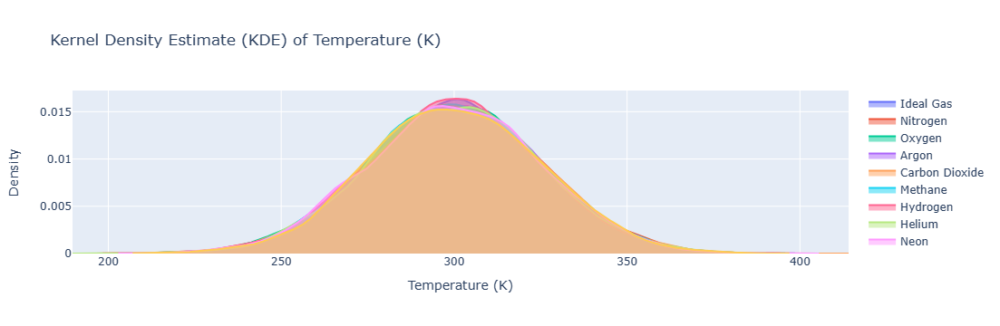

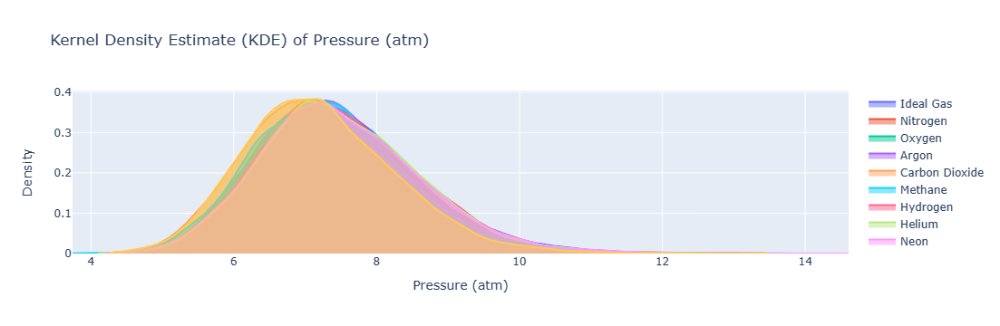

In [3]:
plot_dist(datasets)

## Calculate and plot t-SNE and PCA

Both t-SNE (t-Distributed Stochastic Neighbor Embedding) and PCA (Principal Component Analysis) are dimensionality reduction techniques commonly used to visualize high-dimensional datasets in lower-dimensional space. In this context, we try to use those to see if there are any apparent visual differences between the various datasets. 

- PCA: Projects high-dimensional data onto a lower-dimensional space while preserving as much variance as possible. It's linear and interpretable, suitable for visualizing global structures.
- 
t-SNE: Non-linearly reduces dimensionality, preserving local structures and capturing non-linear relationships. Ideal for visualizing clusters and identifying patterns in complex, high-dimensional data.

In [4]:
data_train_pca, data_test_pca, data_train_tsne, data_test_tsne = calc_pca_tsne(datasets, n_points=1000)

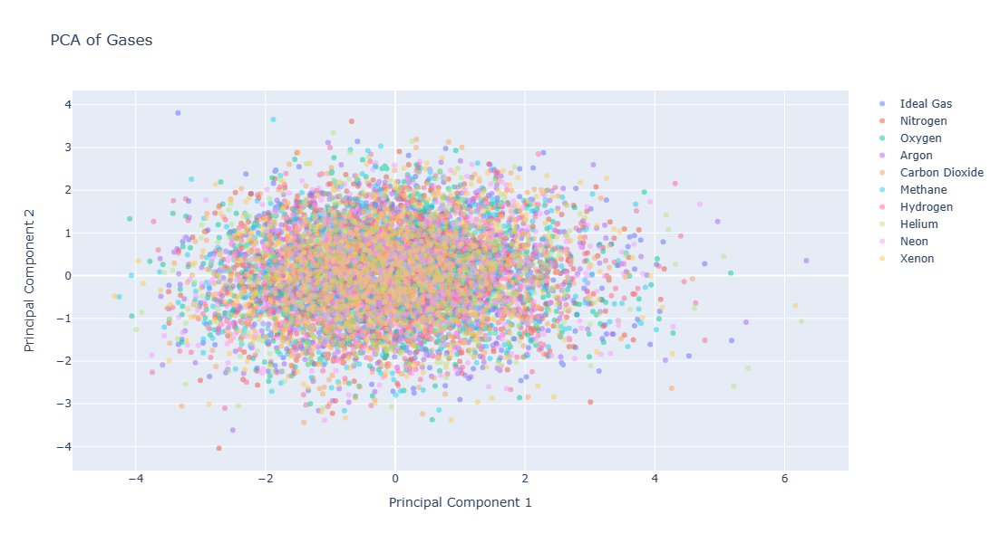

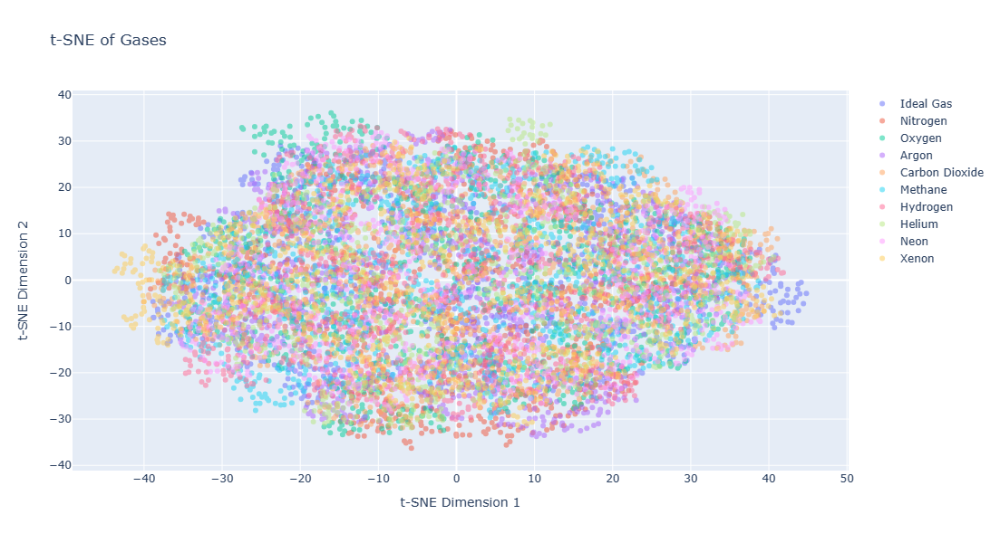

In [5]:
plot_pca_tsne(data_train_pca, data_train_tsne, data_test_pca, data_test_tsne)

# Quantifying data similarity: KL-divergence and Jensen-Shannon distance

A visual comparison does not provide much insight when dealing with subtle differences. For comparing the different datasets generated by the Van der Waals equation, KL-Divergence (Kullback-Leibler Divergence) and Jensen-Shannon Distance are two potential measures to quantify the difference or similarity between the distributions of these datasets.

## KL-Divergence (Kullback-Leibler Divergence)

The KL-Divergence measures the relative entropy between two probability distributions. In the context of comparing different datasets, \( P \) and \( Q \), generated by the Van der Waals equation, the KL-Divergence can be expressed as:

$$
D_{\text{KL}}(P \| Q) = \sum_{x \in \mathcal{X}} P(x) \log \frac{P(x)}{Q(x)}
$$

By computing the KL-Divergence between the probability distributions of the different datasets, we can thus quantify how much one dataset diverges from another.

## Jensen-Shannon Distance

As an alternative metric, The Jensen-Shannon Distance provides a symmetric measure of the similarity between two probability distributions. For the different datasets generated by the Van der Waals equation, the Jensen-Shannon Distance can be calculated as:

$$
D_{\text{JS}}(P, Q) = \frac{1}{2} D_{\text{KL}}(P \| M) + \frac{1}{2} D_{\text{KL}}(Q \| M)
$$

Where \( M \) is the average distribution of \( P \) and \( Q \). By calculating the Jensen-Shannon Distance, we can evaluate the overall difference or similarity between the datasets in a more balanced manner as this represents a symmetric metric. 


## Application in this project: 

When comparing the various datasets, it's valuable to calculate both KL-Divergence and Jensen-Shannon Distance as they are both popular measures to quantify differences between distributions. 

- **KL-Divergence**:  By computing the KL-Divergence between the datasets, we obtain a direct measure of their differences in terms of distribution shape and characteristics. KL-Divergence is sensitive to differences between distributions, making it useful for detecting specific areas where datasets differ significantly.

- **Jensen-Shannon Distance**:  Unlike KL-Divergence, which is a divergence measure, Jensen-Shannon Distance is a proper metric. It combines elements of KL-Divergence to evaluate the overall difference or similarity between datasets in a more balanced manner. Additionally, the Jensen-Shannon Distance is bounded between 0 and 1, where 0 indicates identical distributions and 1 indicates completely different distributions. This bounded nature makes the Jensen-Shannon Distance particularly interpretable and useful for comparing distributions.


We first define our "train" datasets from the ideal gas approximation, and then add the selection of other gases we simulated earlier. 

In [6]:
# Use parts of the training data for an "in distribution" test set: 
data_train, data_in_dist = train_test_split(datasets['Ideal Gas'],test_size=0.3, random_state=42)

#Create dict of all datasets to be compared to the distribution for "data_train"
datasets_to_compare = {
    'data_train': data_train,
    'Ideal Gas' : data_in_dist
}

# Add datasets from the 'datasets' dictionary based on 'gas_data' we defined earlier. 
for gas, props in gas_data.items():
    if gas != "Ideal Gas" and gas in datasets:
        datasets_to_compare[gas] = datasets[gas]



We also need to generate a mesh grid for evaluating the various distributions. 

Note of caution: The total number of function evaluations within the "generate_meshgrid" function scales like  (num_points)^D, where D is the dimensionality of the distribution (i.e. total number of variables). 

In [7]:
x_mesh = generate_meshgrid(datasets, num_points=10)

In [8]:
kl_divergences, js_dist = quantify_similarity(datasets_to_compare,x_mesh)

Completed calculations for dataset: Ideal Gas
Completed calculations for dataset: Nitrogen
Completed calculations for dataset: Oxygen
Completed calculations for dataset: Argon
Completed calculations for dataset: Carbon Dioxide
Completed calculations for dataset: Methane
Completed calculations for dataset: Hydrogen
Completed calculations for dataset: Helium
Completed calculations for dataset: Neon
Completed calculations for dataset: Xenon

KL-div and JS Distance between the training dataset and other datasets:
Dataset              KL-Div               JS Distance         
Ideal Gas            0.10               0.14
Nitrogen             0.33               0.26
Oxygen               0.57               0.33
Argon                0.52               0.32
Carbon Dioxide       5.49               0.73
Methane              1.75               0.49
Hydrogen             0.31               0.25
Helium               0.55               0.33
Neon                 0.14               0.17
Xenon            

# Define dataset for training a ML model: 

Train a ML model based on the Ideal Gas training data, and then try to predict the properties of the other gases: 

In [9]:
X_train_scaled, X_test_id_scaled, y_train_id, y_test_id, X_test_ood_scaled, y_test_ood = get_train_test_data(datasets)

## Define and train ML model: 

In [10]:
model = define_model(input_shape=X_train_scaled.shape[1], learning_rate = 0.01)

epochs=100
batch_size=64

history = model.fit(X_train_scaled, y_train_id, 
                    epochs=epochs, 
                    batch_size=batch_size, 
                    validation_split=0.1, 
                    verbose=0)

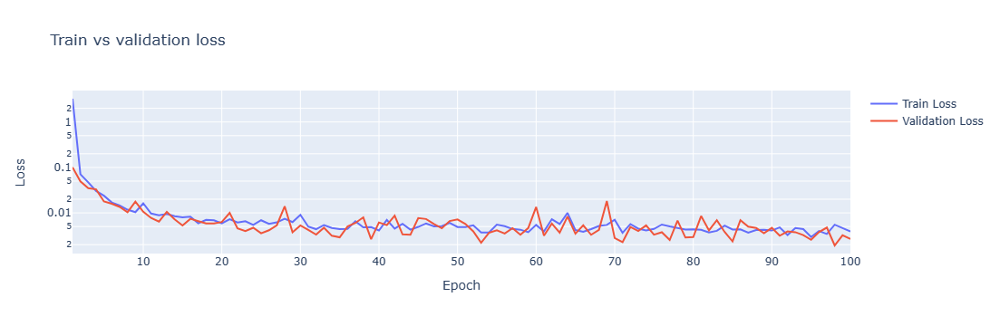

In [11]:
plot_loss_curve(history, epochs)

## Visualize results: 

32/32 [==============================] - 0s 2ms/step


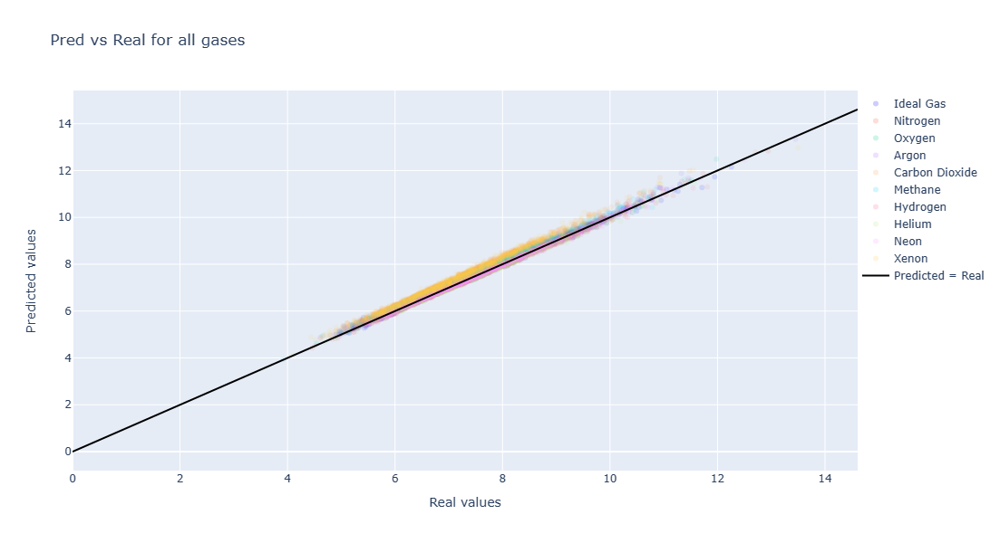

In [12]:
plot_predictions(X_test_id_scaled, y_test_id, X_test_ood_scaled, y_test_ood, model,
                 num_points = 1000,
                 fig_title = 'Pred vs Real for all gases', 
                 x_title='Real values', 
                 y_title='Predicted values')


Compare the predictions of the model with the differences in data distribution, as quantified through KL-div and JS distance

313/313 [==============================] - 1s 2ms/step


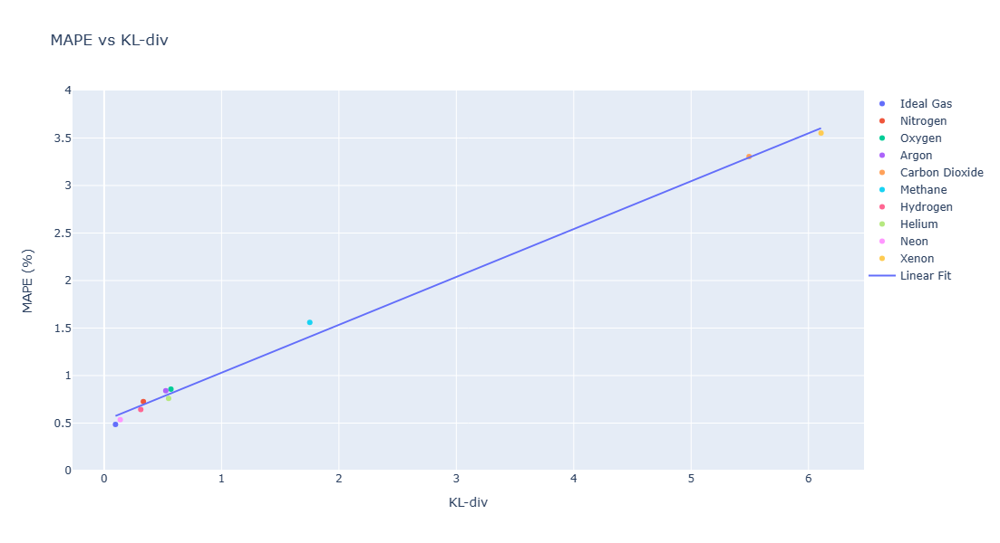

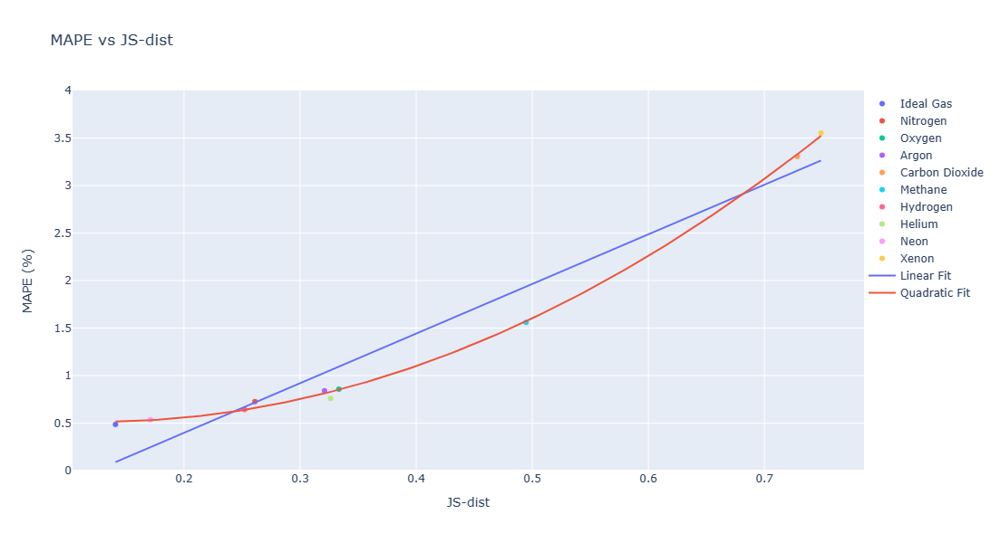

In [13]:
results = calc_results(model, X_test_id_scaled, y_test_id, X_test_ood_scaled, y_test_ood, kl_divergences, js_dist, datasets)
plot_results(results, add_fit=True)

# Experiment 2: Feature distribution drift 

Create two different data distributions for the train and test data. 



In [37]:
# Define the ranges for parameters for Train data 
V_mean, V_std = 10, 1
n_mean, n_std = 10, 1
T_mean, T_std = 273, 50

# Define the ranges for parameters for Test Data 
V_mean_2, V_std_2 = 9, 1.5
n_mean_2, n_std_2 = 11, 1
T_mean_2, T_std_2 = 300, 50



V_mean, V_std = 50, 5 # [L]
n_mean, n_std = 15, 1 # [mol]
T_mean, T_std = 300, 25 # [K]

V_mean_2, V_std_2 = 45, 5 # [L]
n_mean_2, n_std_2 = 15, 2 # [mol]
T_mean_2, T_std_2 = 273, 25 # [K]
# For simplicity, assume Ideal gas for both datasets: 
a, b = 0, 0

# Generate datasets for "in distribution" vs "out of distribution"
num_samples = 10000  # Number of samples 

datasets = {}
datasets['In distribution'] = generate_dataset(num_samples, V_mean, V_std, n_mean, n_std, T_mean, T_std, a, b)
datasets['Out of distribution'] = generate_dataset(num_samples, V_mean_2, V_std_2, n_mean_2, n_std_2, T_mean_2, T_std_2, a, b)


# Visualize dataset:

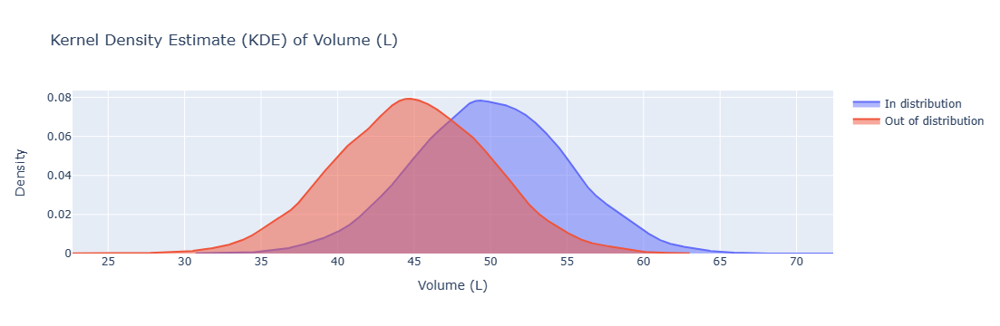

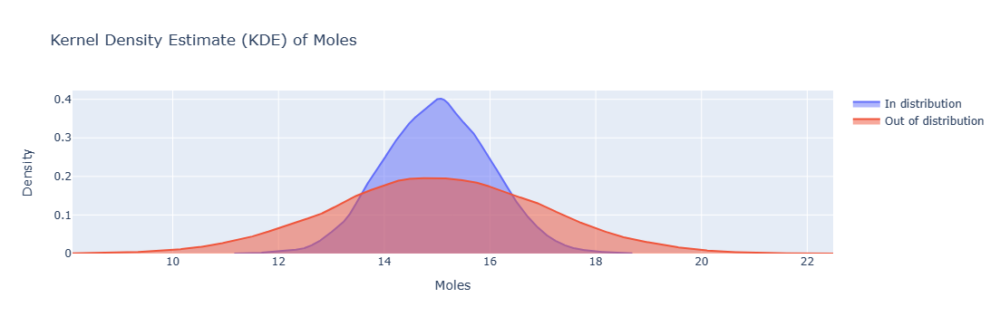

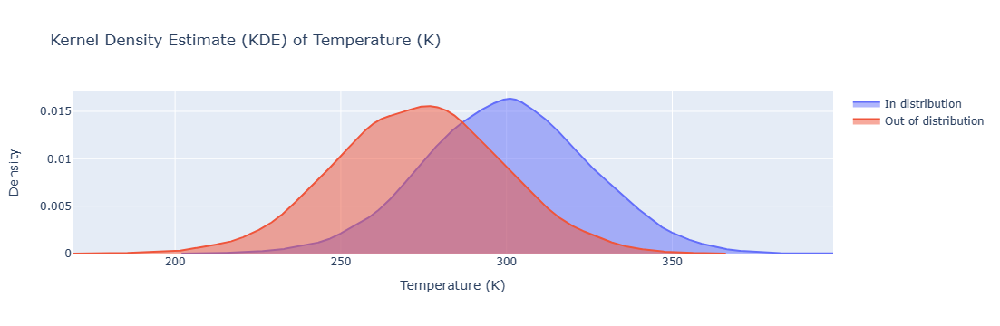

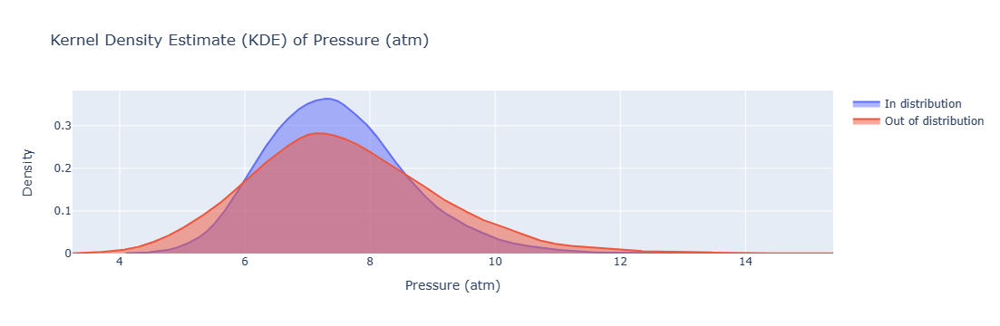

In [38]:
plot_dist(datasets)

## Calculate and plot t-SNE and PCA

In [39]:
data_train_pca, data_test_pca, data_train_tsne, data_test_tsne = calc_pca_tsne(datasets, n_points=1000)

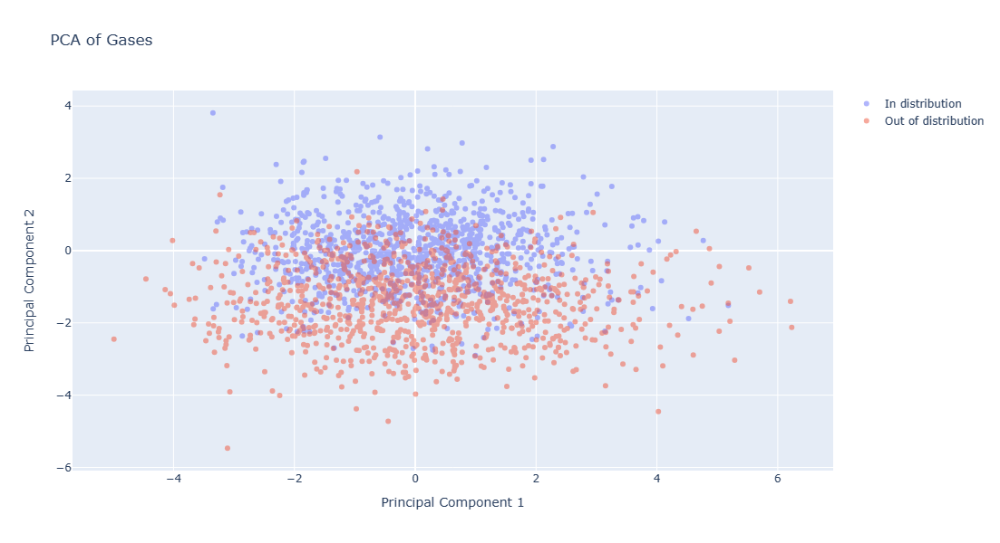

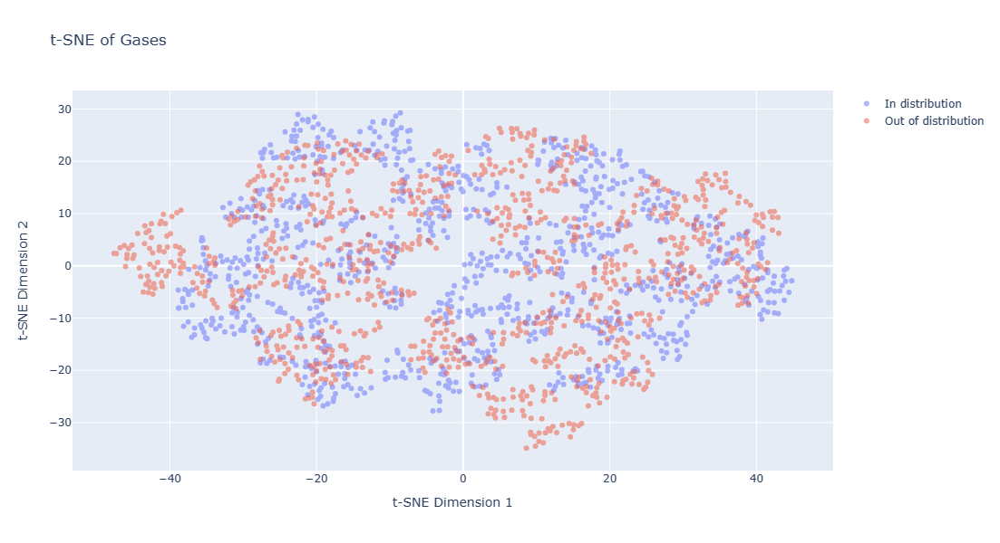

In [40]:
plot_pca_tsne(data_train_pca, data_train_tsne, data_test_pca, data_test_tsne)

## Quantify similarity using KL-div and JS distance: 

In [41]:
# Use parts of the training data for an "in distribution" test set: 
data_train, data_in_dist = train_test_split(datasets[next(iter(datasets))],test_size=0.3, random_state=42)

Generate mesh to evaluate the various distributions: 

In [42]:
x_mesh = generate_meshgrid(datasets, num_points=10)

In [43]:
# Define datasets
datasets_to_compare = {
    'data_train': data_train,
    'In distribution': data_in_dist,
    'Out of distribution': datasets['Out of distribution']  
}

kl_divergences, js_dist = quantify_similarity(datasets_to_compare,x_mesh)


Completed calculations for dataset: In distribution
Completed calculations for dataset: Out of distribution

KL-div and JS Distance between the training dataset and other datasets:
Dataset              KL-Div               JS Distance         
In distribution      0.26               0.16
Out of distribution  1.20               0.47


## Train a machine learning model based on the "in distribution" dataset and then predict on "out of distribution" data

In [44]:
X_train_scaled, X_test_id_scaled, y_train_id, y_test_id, X_test_ood_scaled, y_test_ood = get_train_test_data(datasets)

In [45]:
model = define_model(input_shape=X_train_scaled.shape[1], learning_rate = 0.01)

epochs=100
batch_size=64

history = model.fit(X_train_scaled, y_train_id, 
                    epochs=epochs, 
                    batch_size=batch_size, 
                    validation_split=0.1, 
                    verbose=0)

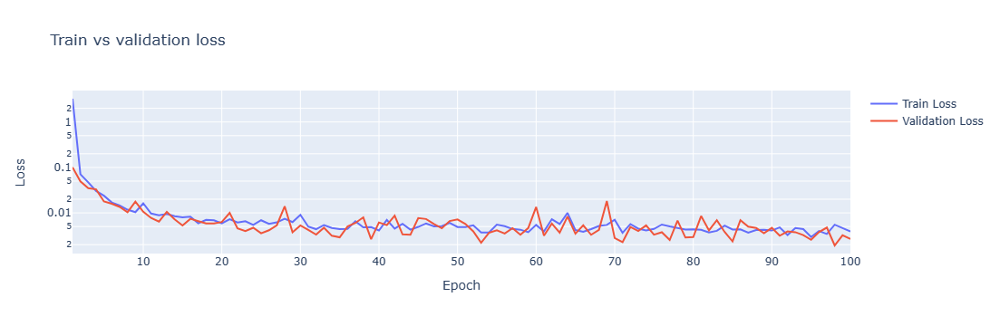

In [46]:
plot_loss_curve(history, epochs)

157/157 [==============================] - 0s 2ms/step


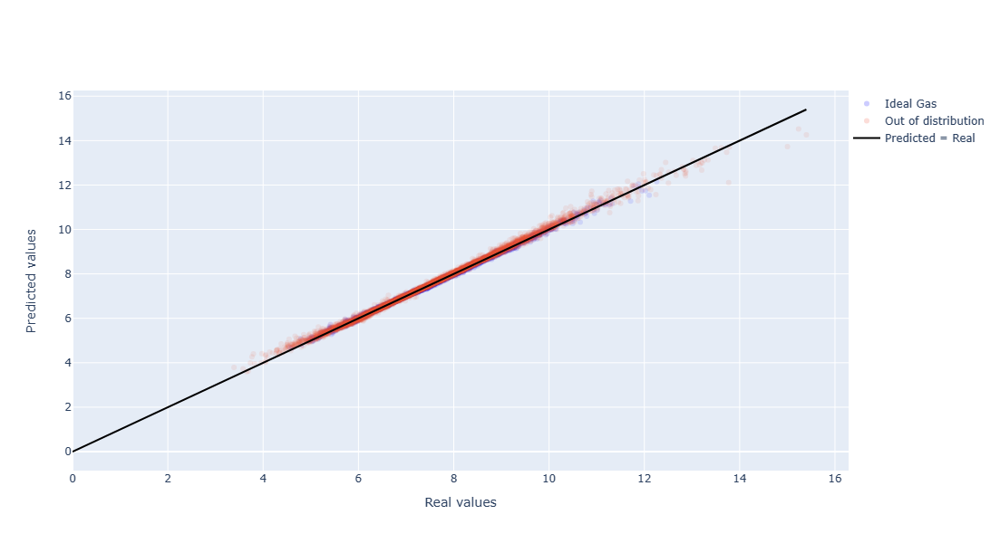

In [47]:
plot_predictions(X_test_id_scaled, y_test_id, X_test_ood_scaled, y_test_ood, model,
                 num_points=5000,
                 x_title='Real values', 
                 y_title='Predicted values')

In [48]:
results = calc_results(model, X_test_id_scaled, y_test_id, X_test_ood_scaled, y_test_ood, kl_divergences, js_dist, datasets)

313/313 [==============================] - 1s 3ms/step


In [49]:
results

{'In distribution': {'MAPE': 0.4896917483539137,
  'MSE': 0.0024150154228177946,
  'KL-div': 0.25565876543110105,
  'JS-dist': 0.16112465062160186},
 'Out of distribution': {'MAPE': 0.8580035429816563,
  'MSE': 0.00982510729040665,
  'KL-div': 1.1987872736371739,
  'JS-dist': 0.4680691927345336}}

## Model uncertainty vs distribution shift:

We now perform a Monte Carlo Dropout during inference as an estimate of model uncertainty, and investigate how this correlates with the degree of distribution shift as quantified through the Mahalanobis distance. 

Monte Carlo Dropout is a technique used to estimate model uncertainty in neural networks during inference, primarily for capturing epistemic uncertainty arising from the model's lack of knowledge or understanding about certain regions of the input space. Instead of turning off dropout as usual during inference, Monte Carlo Dropout keeps dropout active. It performs multiple forward passes through the network, resulting in different predictions $y_i$ for the same input $x$. These predictions are sampled from the model's predictive distribution:

$$ y_i \sim p(y|x, \theta) $$

Where $\theta$ represents the model parameters. By aggregating these predictions and calculating the mean and standard deviation, Monte Carlo Dropout provides insight into the model's uncertainty about its parameters. The mean $\mu$ and standard deviation $\sigma$ are estimated as follows:

$$ \mu = \frac{1}{N} \sum_{i=1}^{N} y_i $$
$$ \sigma = \sqrt{\frac{1}{N} \sum_{i=1}^{N} (y_i - \mu)^2} $$

Where $N$ is the number of forward passes (num_evals below). 


In [50]:
prediction_id, StdDev_id = predict_with_uncertainty(model, X_test_id_scaled, num_evals=100)
prediction_ood, StdDev_ood = predict_with_uncertainty(model, X_test_ood_scaled['Out of distribution'], num_evals=100)

In [51]:
# Calculate MAE
MAE_id = mean_absolute_error(y_test_id, prediction_id)
MAE_ood = mean_absolute_error(y_test_ood['Out of distribution'], prediction_ood)

# Calculate MAPE 
MAPE_id = mean_absolute_percentage_error(y_test_id, prediction_id)*100
MAPE_ood = mean_absolute_percentage_error(y_test_ood['Out of distribution'], prediction_ood)*100

# Print  MAE
print("MAE ID:", MAE_id)
print("MAE OOD:", MAE_ood)

# Print MAPE
print("MAPE ID:", MAPE_id)
print("MAPE OOD:", MAPE_ood)

MAE ID: 0.019610016806008324
MAE OOD: 0.044034166907524847
MAPE ID: 0.2636034111713777
MAPE OOD: 0.603155873106322


We also calculate the elementwise percentage error both for "in distribution" and "out of distribution" data. 

In [52]:
percentage_error_id = elementwise_percentage_error(y_test_id, prediction_id)
percentage_error_ood = elementwise_percentage_error(y_test_ood['Out of distribution'], prediction_ood)

## Mahalanobis distance for "in distribution" vs "out of distribution" data: 

The Mahalanobis distance is a powerful metric for quantifying the dissimilarity of a data point from a distribution, taking into account correlations and the covariance structure of the data. Unlike the Euclidean distance, which measures straight-line distance, Mahalanobis distance is particularly useful in scenarios involving multivariate data with correlated variables.

The formula for Mahalanobis distance is:

$$
D_M(\mathbf{x}) = \sqrt{(\mathbf{x} - \boldsymbol{\mu})^\top \mathbf{S}^{-1} (\mathbf{x} - \boldsymbol{\mu})}
$$

Where:
- $ \mathbf{x}$ is the vector representing the data point.
- $ \boldsymbol{\mu}$ is the mean vector of the (training) distribution.
- $ \mathbf{S}$ is the covariance matrix of the (training) distribution.
- $ (\cdot)^\top $ denotes the transpose of a matrix.


### Application in this context:

By calculating the Mahalanobis distance for each data point in the test set, we can determine not only how different each point is from the training data distribution but also whether our model's predictions for those points fall within the known data distribution (interpolation) or extend beyond it (extrapolation). This distinction is important for understanding the reliability of model predictions, as it helps assess the degree of trustworthiness for each prediction. 


In [53]:
mahalanobis_distances_id = calc_mahalanobis_distances(X_train_scaled, X_test_id_scaled)
mahalanobis_distances_ood = calc_mahalanobis_distances(X_train_scaled, X_test_ood_scaled['Out of distribution'])

Plot histogram of MD for data in the "in distribution" test set. Calculate the 95th percentile for the training data and set this as a cutoff value for "in distribution" vs "out of distribution"


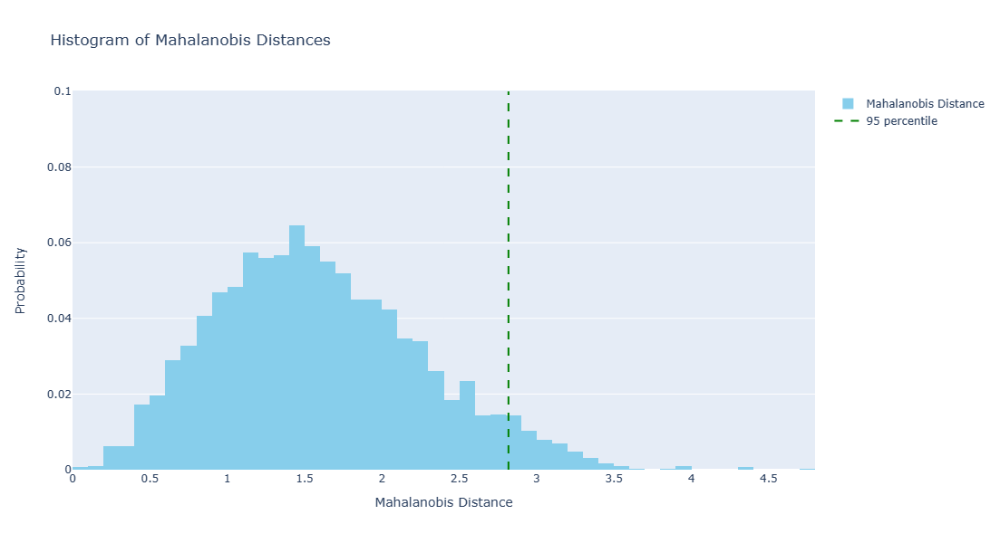

In [54]:
# Calculate the 95th percentile for the "in distribution" data
Cutoff_MD = np.percentile(mahalanobis_distances_id, 95)

# Plot histogram
fig = go.Figure(data=[go.Histogram(x=mahalanobis_distances_id, 
                                   marker_color='skyblue', 
                                   histnorm='probability', 
                                   name='Mahalanobis Distance')])

# Add vertical line at the 95th percentile
fig.add_shape(type="line",
              x0=Cutoff_MD,
              y0=0,
              x1=Cutoff_MD,
              y1=.1,  # Max probability for normalized histogram
              line=dict(color="green", width=2, dash="dash"),
              name='95 percentile',
              showlegend=True)

# Update layout
fig.update_layout(title='Histogram of Mahalanobis Distances',
                  xaxis_title='Mahalanobis Distance',
                  yaxis_title='Probability',
                  width=800,  # Set the width to 800 pixels
                  height=600,  # Set the height to 600 pixels
                  showlegend=True)  # Show legend

fig.show()

## Model accuracy vs Mahalanobis distance: 

We can then evaluate the model accuracy and see how that correlates with the model being in a "interpolation" vs "extrapolation" regime, as quantified throught the Mahalanobis distance for each datapoint in the test set. 

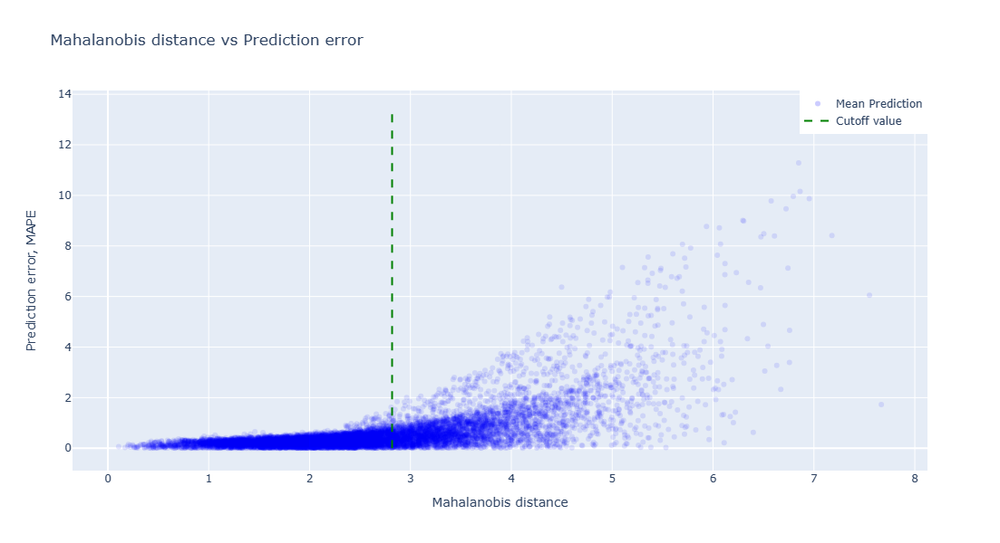

In [55]:
plot_relationship(mahalanobis_distances_ood, percentage_error_ood, X_cut = Cutoff_MD, n_points=10000,
                  fig_title = 'Mahalanobis distance vs Prediction error', 
                  x_title= 'Mahalanobis distance', 
                  y_title = 'Prediction error, MAPE')

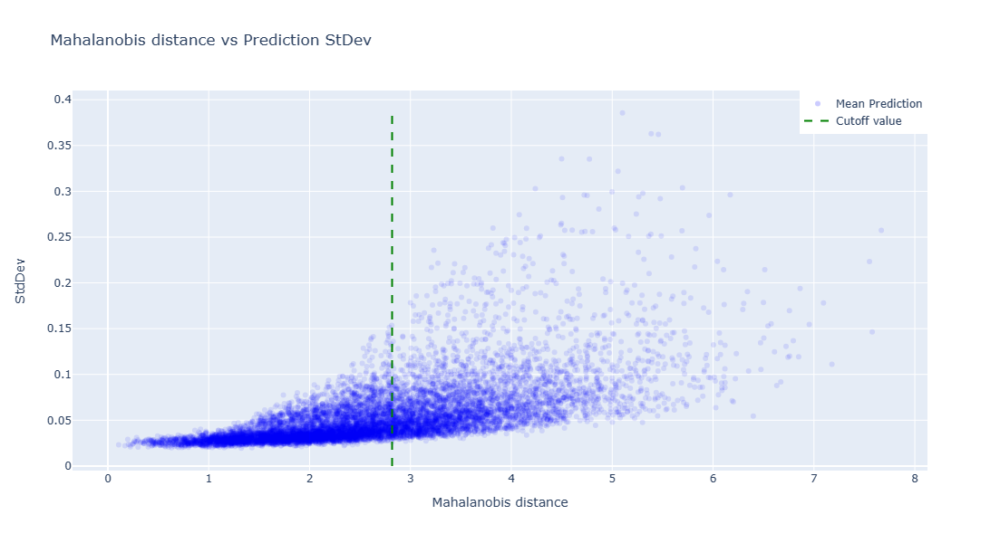

In [56]:
plot_relationship(mahalanobis_distances_ood, StdDev_ood, X_cut = Cutoff_MD, n_points = 10000,
                  fig_title = 'Mahalanobis distance vs Prediction StDev', 
                  x_title= 'Mahalanobis distance', 
                  y_title = 'StdDev')

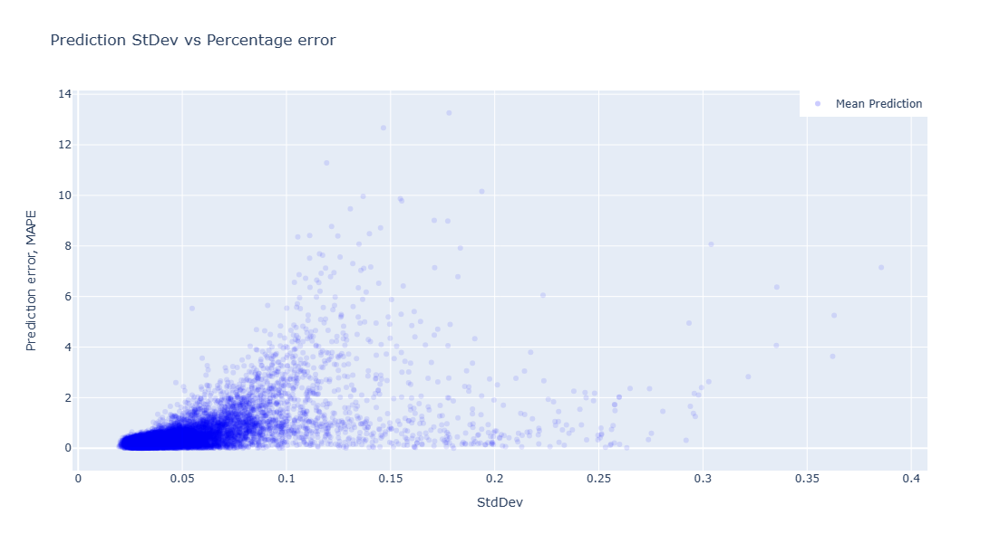

In [57]:
plot_relationship(StdDev_ood, percentage_error_ood, n_points = 10000,
                  fig_title = 'Prediction StDev vs Percentage error', 
                  x_title= 'StdDev', 
                  y_title = 'Prediction error, MAPE')